## Python data analysis and machine learning
### 楊英豪 B1083207

In [3]:
import numpy as np
import pandas as pd
import cv2 as cv
from sklearn.preprocessing import MultiLabelBinarizer
import torch
import torch.optim as optim
from torchvision import models
from torch.autograd import Variable
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import torch.nn as nn
import glob
from PIL import Image
import matplotlib.pyplot as plt
import torch.utils.data as data_utils
import os


## The code below is to find the number of genres

In [5]:
df = pd.read_csv('movies.csv')
df.drop_duplicates(inplace = True)

#split the genre column by ; and stack the result
genres= df['Genre'].str.split(';', expand = True).stack()

#find unique values
unique_genres  = genres.unique()
df.head()
print("Total number of genres: ",len(unique_genres))

Total number of genres:  24


## Preprocess the data

In [6]:
df = pd.read_csv('movies.csv')
#remove duplicates and set imdbID as index
df = df.drop_duplicates(subset=["imdbId"], keep="last")
df.set_index("imdbId", inplace=True)

In [7]:
# Create a copy of the dataframe
df_copy = df.copy()

#only take the genre and the local_image_path
df_copy = df_copy[['Genre', 'local_image_path']]

# Split the genre column into a list of genres for each movie
df_copy['Genre'] = df_copy['Genre'].apply(lambda x: x.split(';'))
df_copy.head()

,Genre,local_image_path
imdbId,,
114709,"[Animation, Adventure, Comedy]",images/114709_.jpg
113497,"[Action, Adventure, Family]",images/113497_.jpg
113277,"[Action, Crime, Drama]",images/113277_.jpg
114319,"[Comedy, Drama]",images/114319_.jpg
114576,"[Action, Crime, Thriller]",images/114576_.jpg


In [8]:
# Create an instance of MultiLabelBinarizer and fit_transform the Genre column
mlb = MultiLabelBinarizer()
one_hot = mlb.fit_transform(df_copy['Genre'])
print(mlb.classes_)

# Create a new dataframe with the one-hot encoded genre columns and image paths
df_one_hot = pd.DataFrame({'Genres': list(one_hot), 'local_path': df['local_image_path']})
df_one_hot.head()


['Action' 'Adventure' 'Animation' 'Biography' 'Comedy' 'Crime'
 'Documentary' 'Drama' 'Family' 'Fantasy' 'Film-Noir' 'History' 'Horror'
 'Music' 'Musical' 'Mystery' 'News' 'Romance' 'Sci-Fi' 'Short' 'Sport'
 'Thriller' 'War' 'Western']


,Genres,local_path
imdbId,,
114709,"[0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",images/114709_.jpg
113497,"[1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, ...",images/113497_.jpg
113277,"[1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, ...",images/113277_.jpg
114319,"[0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, ...",images/114319_.jpg
114576,"[1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",images/114576_.jpg


In [9]:
multihot_dict = df_one_hot["Genres"].to_dict()
# print(multihot_dict)

In [10]:
#training controls
batch_size = 1
number_of_labels = 24
epochs = 10
training_size = 0.7
learning_rate = 0.5 #0.1 #0.01 #0.001
dropout = [0.3, 0.3, 0.3, 0.3, 0.2, 0.2, 0.2, 0.2, 0.15]
# input image dimensions
img_rows, img_cols = 100, 100

In [11]:
# the data holders
x_test = []
x_train = []
y_test = []
y_train = []

#images need to have the same size!!
flist=glob.glob('./images/*.jpg')

length=int(len(flist)*training_size)
i = 0


genre_count = np.empty([number_of_labels])
for l in range(number_of_labels):
    genre_count[l] = 0

# print(multihot_dict)
#create lists with input data (images) and output data (multi-hot encoded genre vectors)
for filename in flist:
    imdb_id = int(str(filename.split('\\')[-1][:-4]).replace("_",""))
    # imdb_id = filename.replace("./images/", "").replace("'","").replace("_","").replace(".jpg","")
    if int(imdb_id) in multihot_dict:
        img = np.array(cv.imread(filename))
        #do transpose so that match pytorch from h.w.c from opencv to c.w.h
        img = np.swapaxes(img, 2, 0)
        #do transpose so that match pytorch from c.w.h from opencv to c.h.w
        img = np.swapaxes(img, 2, 1)

        genre_arr = np.empty([number_of_labels])
        for j in range(len(multihot_dict[imdb_id])):
            genre_arr[j] = multihot_dict[imdb_id][j]
            if multihot_dict[imdb_id][j] == 1:
                genre_count[j] += 1

        if i < length:
            x_train.append(img)
            y_train.append(genre_arr)
        else:
            x_test.append(img)
            y_test.append(genre_arr)

        i += 1
    else:
        print(f"imdb_id {imdb_id} not found in multihot_dict")
classes = ["Action", "Adventure", "Animation", "Biography", "Comedy", "Crime", "Documentary", "Drama", "Family", "Fantasy", "History", "Horror", "Music", "Mystery", "Romance", "Sci-Fi", "Sport", "War", "Other"]
img_sum = 0
for c in range(19):
    print(classes[c] + ": "+ str(genre_count[c]))
    img_sum += genre_count[c]

Action: 976.0
Adventure: 789.0
Animation: 177.0
Biography: 238.0
Comedy: 1283.0
Crime: 828.0
Documentary: 28.0
Drama: 1929.0
Family: 213.0
Fantasy: 392.0
History: 54.0
Horror: 117.0
Music: 744.0
Mystery: 98.0
Romance: 69.0
Sci-Fi: 423.0
Sport: 1.0
War: 585.0
Other: 425.0


In [12]:
print(len(x_train))
print(len(y_train))

print(len(x_train[0]))
print(len(y_train[0]))

print(len(x_test[0]))
print(len(y_test[0]))

2849
2849
3
24
3
24


In [13]:
#converting the data from lists to numpy arrays
x_train=np.asarray(x_train,dtype=float)
x_test=np.asarray(x_test,dtype=float)
y_train=np.asarray(y_train,dtype=float)
y_test=np.asarray(y_test,dtype=float)

#scaling down the RGB data
x_train /= 255
x_test /= 255

#printing stats about the features
print('x_train shape:', x_train.shape)
print(x_train.shape[0], 'train samples')
print(x_test.shape[0], 'test samples')

train_length = x_train.shape[0]

x_train=torch.from_numpy(x_train)
x_test=torch.from_numpy(x_test)
y_train=torch.from_numpy(y_train)
y_test=torch.from_numpy(y_test)

train = data_utils.TensorDataset(x_train, y_train)
train_loader = data_utils.DataLoader(train, batch_size=batch_size, shuffle=True)

test = data_utils.TensorDataset(x_test, y_test)
test_loader = data_utils.DataLoader(test, batch_size=batch_size, shuffle=False)

x_train shape: (2849, 3, 268, 182)
2849 train samples
1222 test samples


Works

In [14]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision.models import densenet121

# Create the DenseNet model
model = densenet121(pretrained=True)
num_classes = 24  # Number of labels
num_features = model.classifier.in_features
model.classifier = nn.Linear(num_features, num_classes)

# Convert your data to PyTorch tensors (X_train, y_train, X_test, y_test)

# Convert the model's parameters to the appropriate data type
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

# Define the loss function and optimizer
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters())

# Create PyTorch DataLoader for efficient data loading
train_data = torch.utils.data.TensorDataset(x_train.to(device).float(), y_train.to(device))
train_loader = torch.utils.data.DataLoader(train_data, batch_size=64, shuffle=True)

# Training loop
num_epochs = 5

for epoch in range(num_epochs):
    running_loss = 0.0
    correct = 0
    total = 0

    for inputs, labels in train_loader:
        inputs = inputs.to(device).float()  # Convert input tensor to the appropriate data type
        labels = labels.to(device)

        # Zero the parameter gradients
        optimizer.zero_grad()

        # Forward pass
        outputs = model(inputs)
        loss = criterion(outputs, labels)

        # Backward pass and optimization
        loss.backward()
        optimizer.step()

        # Compute training accuracy
        predictions = torch.sigmoid(outputs)  # Apply sigmoid activation to convert logits to probabilities
        predicted_labels = (predictions > 0.5).float()  # Use a threshold of 0.5 for label prediction
        correct += (predicted_labels == labels).sum().item()
        total += labels.size(0)

        running_loss += loss.item()

    epoch_loss = running_loss / len(train_loader)
    epoch_accuracy = correct / total

    print(f'Epoch {epoch+1}/{num_epochs}: Loss: {epoch_loss:.4f}, Accuracy: {epoch_accuracy:.4f}')

# Save the trained model
torch.save(model.state_dict(), 'trained_model.pth')

RuntimeError: CUDA out of memory. Tried to allocate 1.55 GiB (GPU 0; 4.00 GiB total capacity; 3.16 GiB already allocated; 0 bytes free; 3.18 GiB reserved in total by PyTorch)

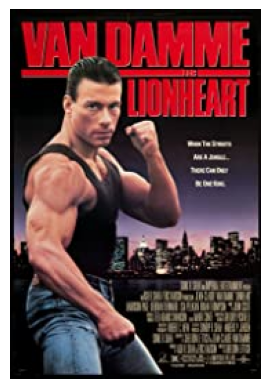

Image 1: 100029_.jpg
Ground Truth:  ['Action', 'Crime', 'Drama']
Comedy: 0.9971981048583984
Drama: 0.9448384046554565
Family: 0.29934388399124146



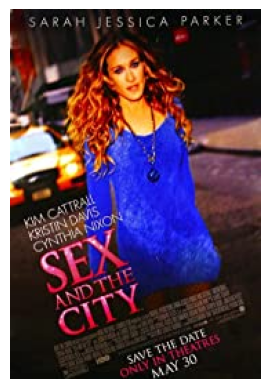

Image 2: 1000774_.jpg
Ground Truth:  ['Comedy', 'Drama', 'Romance']
Comedy: 0.9989826083183289
Drama: 0.9901002049446106
Family: 0.9147009253501892



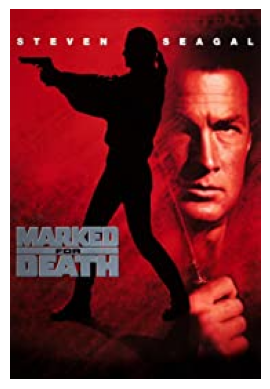

Image 3: 100114_.jpg
Ground Truth:  ['Action', 'Adventure', 'Crime']
Comedy: 0.9928426742553711
Crime: 0.4021669030189514
Adventure: 0.33850109577178955



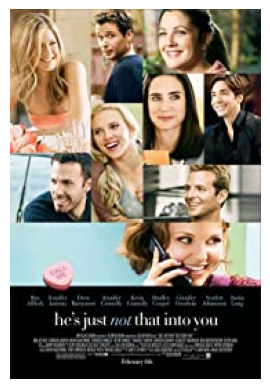

Image 4: 1001508_.jpg
Ground Truth:  ['Comedy', 'Drama', 'Romance']
Drama: 0.9837011694908142
Comedy: 0.9508673548698425
Romance: 0.3950668275356293



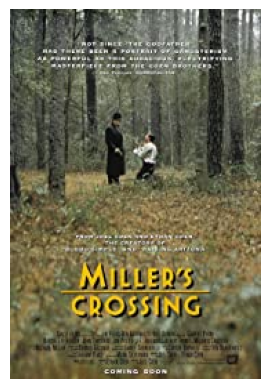

Image 5: 100150_.jpg
Ground Truth:  ['Crime', 'Drama', 'Thriller']
Drama: 0.9955090284347534
Mystery: 0.9731087684631348
Animation: 0.054054148495197296



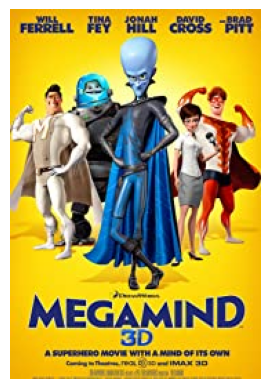

Image 6: 1001526_.jpg
Ground Truth:  ['Animation', 'Action', 'Comedy']
Adventure: 0.9999996423721313
Animation: 0.9999181032180786
Comedy: 0.9835276007652283



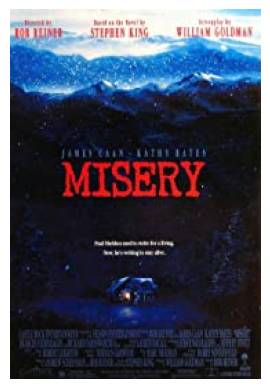

Image 7: 100157_.jpg
Ground Truth:  ['Crime', 'Drama', 'Thriller']
Drama: 0.9907630085945129
Sport: 0.40626442432403564
History: 0.10945399850606918



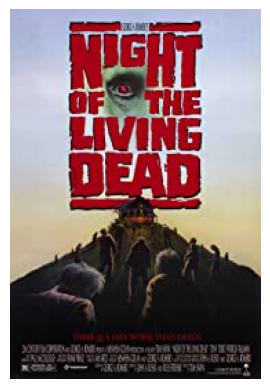

Image 8: 100258_.jpg
Ground Truth:  ['Horror']
Comedy: 0.7090775966644287
Sci-Fi: 0.3270837664604187
Drama: 0.23384882509708405



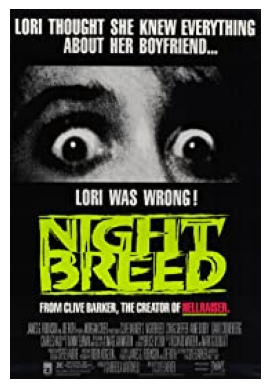

Image 9: 100260_.jpg
Ground Truth:  ['Action', 'Fantasy', 'Horror']
Crime: 0.9709872007369995
Comedy: 0.8885917067527771
Adventure: 0.6206666827201843



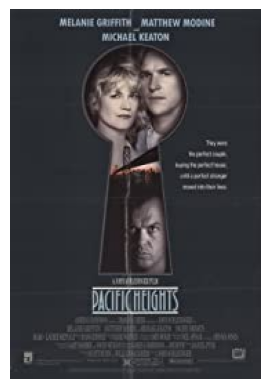

Image 10: 100318_.jpg
Ground Truth:  ['Thriller']
Drama: 0.9947534799575806
Fantasy: 0.6187066435813904
Comedy: 0.41592004895210266



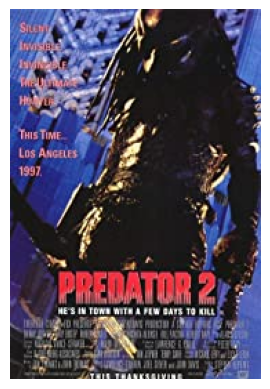

Image 11: 100403_.jpg
Ground Truth:  ['Action', 'Horror', 'Sci-Fi']
Action: 0.999913215637207
Sci-Fi: 0.9997833371162415
Adventure: 0.9989653825759888



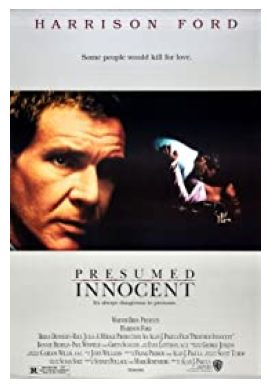

Image 12: 100404_.jpg
Ground Truth:  ['Mystery', 'Thriller']
Drama: 0.9999821186065674
Adventure: 0.34720900654792786
Sport: 0.3195144236087799



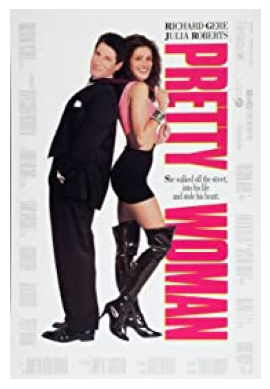

Image 13: 100405_.jpg
Ground Truth:  ['Comedy', 'Romance']
Comedy: 0.999997615814209
Crime: 0.9519386291503906
Romance: 0.462502121925354



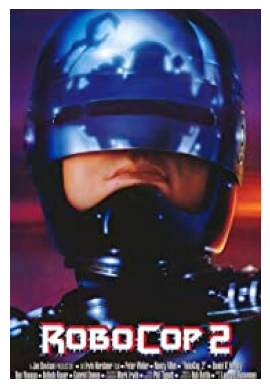

Image 14: 100502_.jpg
Ground Truth:  ['Action', 'Crime', 'Sci-Fi']
Drama: 0.9894327521324158
Sci-Fi: 0.9765157103538513
Action: 0.95733243227005



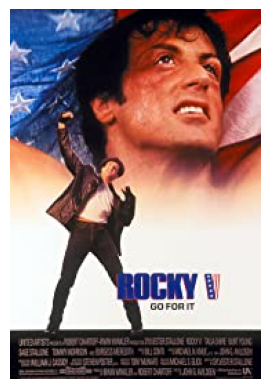

Image 15: 100507_.jpg
Ground Truth:  ['Drama', 'Sport']
Family: 0.9987210631370544
Adventure: 0.8513094186782837
Drama: 0.7684204578399658



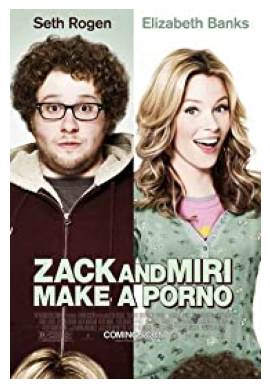

Image 16: 1007028_.jpg
Ground Truth:  ['Comedy', 'Romance']
Comedy: 0.9994134902954102
Romance: 0.9854444861412048
Drama: 0.9583641886711121



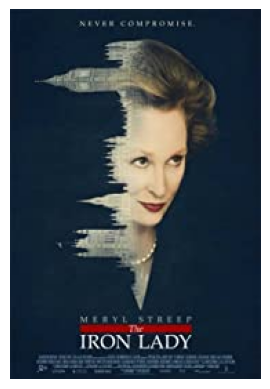

Image 17: 1007029_.jpg
Ground Truth:  ['Biography', 'Drama']
Drama: 0.9917299151420593
Romance: 0.8864831328392029
Action: 0.4319702684879303



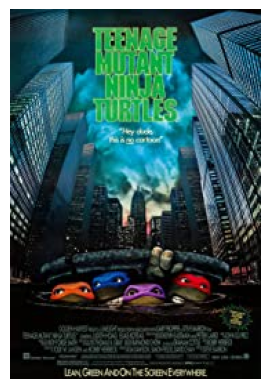

Image 18: 100758_.jpg
Ground Truth:  ['Action', 'Adventure', 'Comedy']
Adventure: 0.9999994039535522
Sci-Fi: 0.9728063344955444
Action: 0.931372344493866



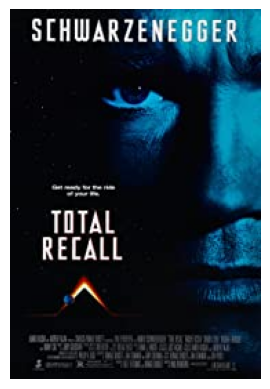

Image 19: 100802_.jpg
Ground Truth:  ['Action', 'Sci-Fi', 'Thriller']
Drama: 0.9941707253456116
Thriller: 0.9621220231056213
Fantasy: 0.27746856212615967



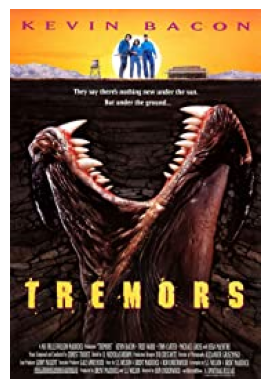

Image 20: 100814_.jpg
Ground Truth:  ['Comedy', 'Horror']
Drama: 0.9805632829666138
Sci-Fi: 0.8382740020751953
Action: 0.5252472758293152



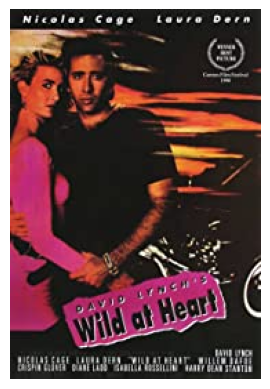

Image 21: 100935_.jpg
Ground Truth:  ['Comedy', 'Crime', 'Drama']
Drama: 0.9986425042152405
Comedy: 0.6178751587867737
Fantasy: 0.1475374847650528



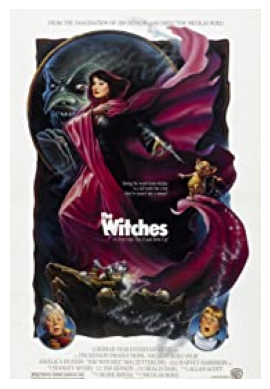

Image 22: 100944_.jpg
Ground Truth:  ['Adventure', 'Comedy', 'Fantasy']
Drama: 0.9932466745376587
Comedy: 0.9911391139030457
Family: 0.4779512882232666



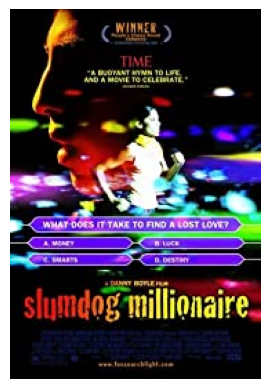

Image 23: 1010048_.jpg
Ground Truth:  ['Drama']
Drama: 0.9915804266929626
Animation: 0.5787734985351562
Action: 0.27301862835884094



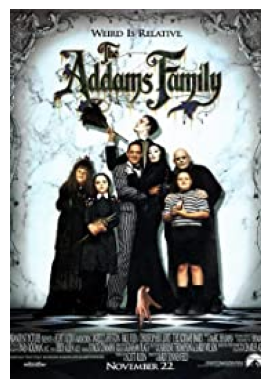

Image 24: 101272_.jpg
Ground Truth:  ['Comedy', 'Fantasy']
Drama: 0.9656103849411011
Comedy: 0.9178924560546875
Fantasy: 0.8160644769668579



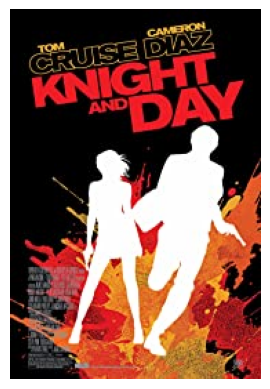

Image 25: 1013743_.jpg
Ground Truth:  ['Action', 'Comedy', 'Romance']
Drama: 0.9932044744491577
Animation: 0.5114398002624512
Comedy: 0.495114266872406



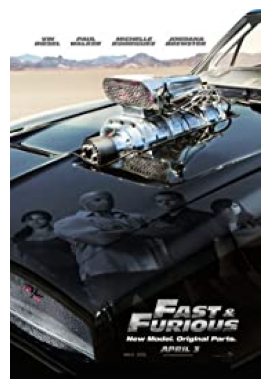

Image 26: 1013752_.jpg
Ground Truth:  ['Action', 'Crime', 'Thriller']
Drama: 0.9999996423721313
Sport: 0.30487802624702454
Thriller: 0.05480516329407692



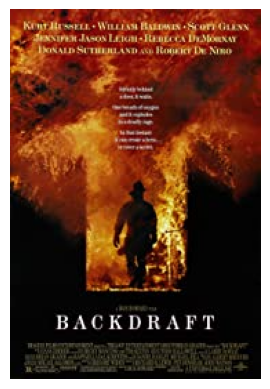

Image 27: 101393_.jpg
Ground Truth:  ['Action', 'Crime', 'Drama']
Adventure: 0.9999136924743652
Fantasy: 0.9902389049530029
Family: 0.9798415899276733



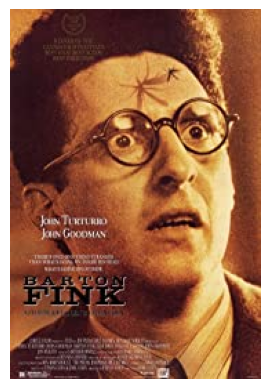

Image 28: 101410_.jpg
Ground Truth:  ['Comedy', 'Drama', 'Thriller']
Drama: 0.9999279975891113
Comedy: 0.79343181848526
Family: 0.45706334710121155



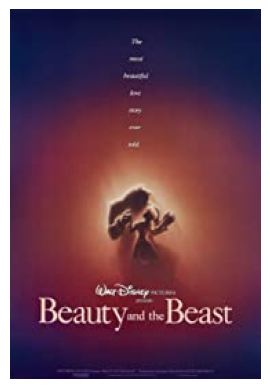

Image 29: 101414_.jpg
Ground Truth:  ['Animation', 'Family', 'Fantasy']
Adventure: 0.9963129162788391
Family: 0.906627893447876
Drama: 0.8695700168609619



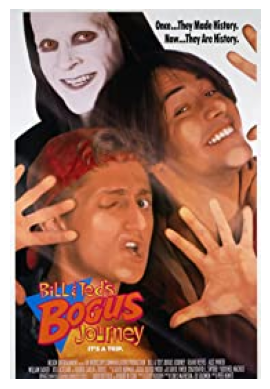

Image 30: 101452_.jpg
Ground Truth:  ['Adventure', 'Comedy', 'Fantasy']
Drama: 0.9996961355209351
Animation: 0.4782039225101471
Sci-Fi: 0.11872508376836777



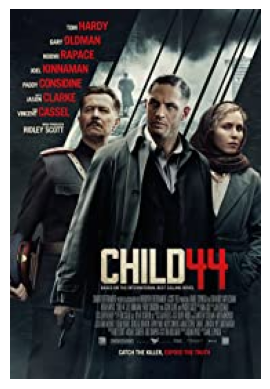

Image 31: 1014763_.jpg
Ground Truth:  ['Crime', 'Drama', 'Thriller']
Adventure: 0.9999850988388062
Action: 0.998170018196106
Sci-Fi: 0.9942663311958313



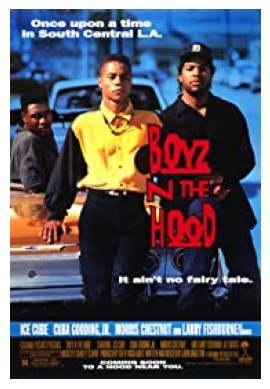

Image 32: 101507_.jpg
Ground Truth:  ['Crime', 'Drama']
Comedy: 0.9999802112579346
Drama: 0.9736273884773254
Romance: 0.19745278358459473



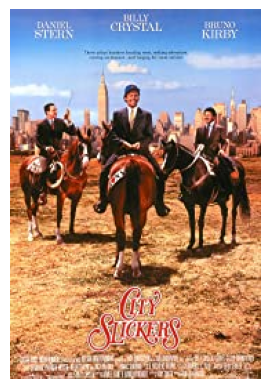

Image 33: 101587_.jpg
Ground Truth:  ['Comedy']
Family: 0.9491612911224365
Sci-Fi: 0.7083884477615356
Adventure: 0.5210902094841003



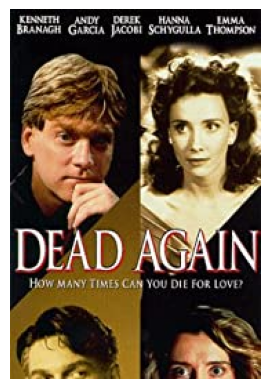

Image 34: 101669_.jpg
Ground Truth:  ['Crime', 'Drama', 'Mystery']
Drama: 0.9999986886978149
Family: 0.3838215172290802
Crime: 0.0704035684466362



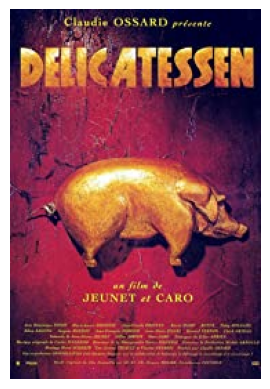

Image 35: 101700_.jpg
Ground Truth:  ['Comedy', 'Crime']
Comedy: 0.9985003471374512
Adventure: 0.9980098605155945
Drama: 0.7775101661682129



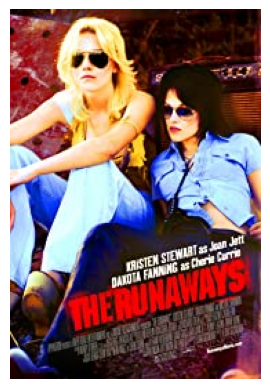

Image 36: 1017451_.jpg
Ground Truth:  ['Biography', 'Drama', 'Music']
Adventure: 0.9998438358306885
Drama: 0.9983096122741699
Animation: 0.9972545504570007



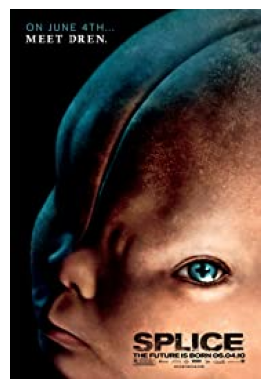

Image 37: 1017460_.jpg
Ground Truth:  ['Drama', 'Horror', 'Sci-Fi']
Action: 0.8472731113433838
Crime: 0.8198226094245911
Comedy: 0.6072309017181396



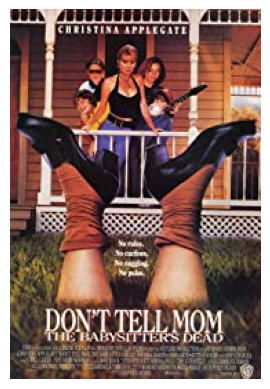

Image 38: 101757_.jpg
Ground Truth:  ['Comedy']
Adventure: 0.9817450642585754
Drama: 0.8228088617324829
Animation: 0.8140082359313965



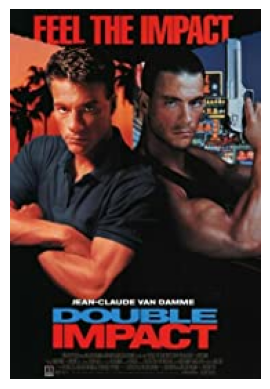

Image 39: 101764_.jpg
Ground Truth:  ['Action', 'Crime']
Comedy: 0.989899218082428
Drama: 0.9834501147270203
Romance: 0.12198473513126373



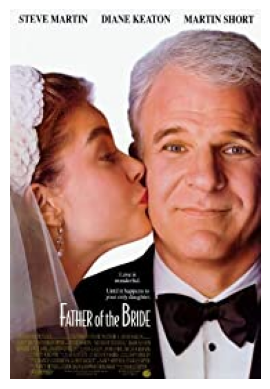

Image 40: 101862_.jpg
Ground Truth:  ['Comedy', 'Family', 'Romance']
Drama: 0.9999889135360718
Comedy: 0.9837934374809265
Family: 0.09052810817956924



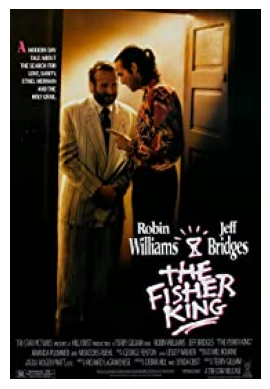

Image 41: 101889_.jpg
Ground Truth:  ['Comedy', 'Drama', 'Fantasy']
Drama: 0.9999979734420776
Comedy: 0.9748944640159607
Crime: 0.0509663000702858



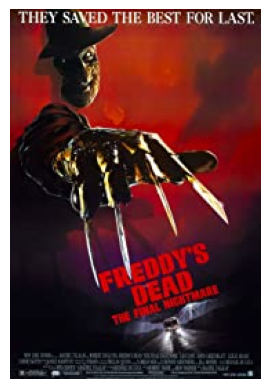

Image 42: 101917_.jpg
Ground Truth:  ['Comedy', 'Fantasy', 'Horror']
Family: 0.9947243332862854
Adventure: 0.9898377656936646
Animation: 0.5749533176422119



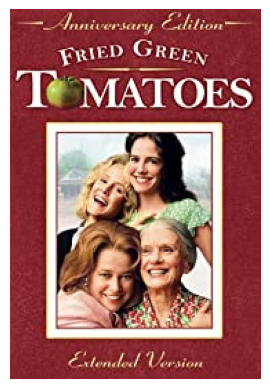

Image 43: 101921_.jpg
Ground Truth:  ['Drama']
Family: 0.9997102618217468
Comedy: 0.99910968542099
Fantasy: 0.6532158851623535



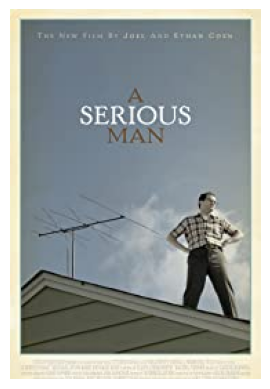

Image 44: 1019452_.jpg
Ground Truth:  ['Comedy', 'Drama']
Drama: 0.9977413415908813
Comedy: 0.6982590556144714
Thriller: 0.3569701910018921



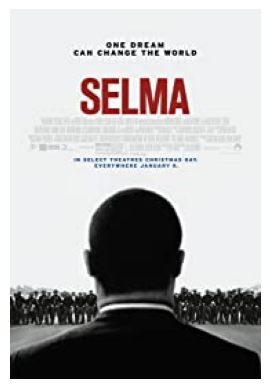

Image 45: 1020072_.jpg
Ground Truth:  ['Biography', 'Drama', 'History']
Drama: 0.9999933242797852
Sport: 0.29026979207992554
Family: 0.21773356199264526



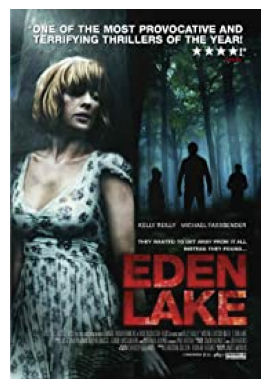

Image 46: 1020530_.jpg
Ground Truth:  ['Horror']
Comedy: 0.999040424823761
Sci-Fi: 0.9672946929931641
Drama: 0.8522685766220093



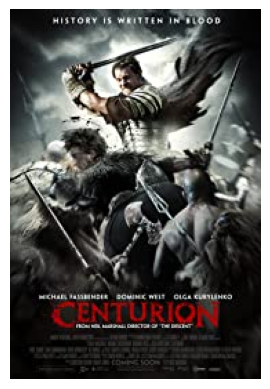

Image 47: 1020558_.jpg
Ground Truth:  ['Action', 'Adventure', 'Drama']
Action: 0.9999964237213135
Adventure: 0.9995753169059753
Fantasy: 0.9971206188201904



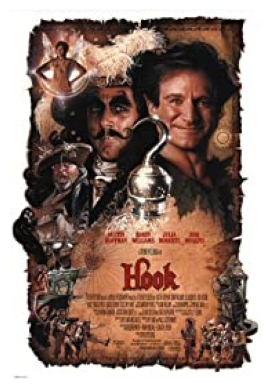

Image 48: 102057_.jpg
Ground Truth:  ['Adventure', 'Comedy', 'Family']
Adventure: 0.9747517108917236
Drama: 0.9470825791358948
Sci-Fi: 0.6537646651268005



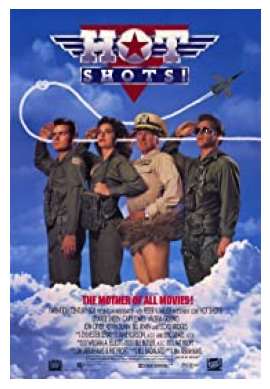

Image 49: 102059_.jpg
Ground Truth:  ['Action', 'Comedy']
Comedy: 0.9999488592147827
Drama: 0.9569748640060425
Animation: 0.5904105305671692



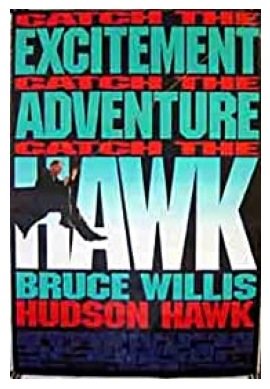

Image 50: 102070_.jpg
Ground Truth:  ['Action', 'Adventure', 'Comedy']
Adventure: 0.999875545501709
Comedy: 0.9891538023948669
Animation: 0.7145459651947021



In [18]:
import torch
import torch.nn as nn
from torchvision.models import densenet121
from PIL import Image
import os
import numpy as np
import matplotlib.pyplot as plt

# Define the necessary preprocessing steps
def preprocess_image(image_path):
    img = Image.open(image_path).convert('RGB')
    img = img.resize((100, 100))  # Resize the image to match the input size of the model
    img = torch.from_numpy(np.array(img)).float()  # Convert the image to a PyTorch tensor
    img = img.permute(2, 0, 1)  # Transpose the image to match the model's input shape
    img = img / 255.0  # Normalize the image by dividing by 255
    return img.unsqueeze(0)  # Add a batch dimension

# Load the trained model
model = densenet121(pretrained=False)
num_features = model.classifier.in_features
num_classes = 24  # Adjust the number of classes based on your model
model.classifier = nn.Linear(num_features, num_classes)
model.load_state_dict(torch.load('trained_model.pth'))
model.eval()

# Define the genre labels
genre_labels = ['Action', 'Adventure', 'Animation', 'Biography', 'Comedy', 'Crime',
                'Documentary', 'Drama', 'Family', 'Fantasy', 'Film-Noir', 'History', 'Horror',
                'Music', 'Musical', 'Mystery', 'News', 'Romance', 'Sci-Fi', 'Short', 'Sport',
                'Thriller', 'War', 'Western']

# Specify the path to the images folder
images_folder = './images/'

# Loop over the first 50 images in the folder
for i, image_file in enumerate(os.listdir(images_folder)[:50]):
    image_path = os.path.join(images_folder, image_file)
    preprocessed_image = preprocess_image(image_path)
    outputs = model(preprocessed_image)

    # Get the predicted genre probabilities
    genre_probabilities = torch.sigmoid(outputs[0]).detach().numpy()

    # Create a dictionary mapping genres to probabilities
    genre_predictions = {}
    for j, label in enumerate(genre_labels):
        genre_predictions[label] = genre_probabilities[j]

    # Sort the predictions by probability in descending order
    sorted_predictions = sorted(genre_predictions.items(), key=lambda x: x[1], reverse=True)

    # Display the image
    img = Image.open(image_path)
    plt.imshow(img)
    plt.axis('off')
    plt.show()

    # Get the imdbId from the image file name
    imdb_id = int(image_file.split("_")[0])

    # Get the ground truth genre from the dataframe based on the imdbId
    ground_truth_genre = df_copy.loc[imdb_id][0]

    # Print the top predicted genres and their probabilities
    print(f"Image {i+1}: {image_file}")
    print("Ground Truth: ", ground_truth_genre)
    for genre, probability in sorted_predictions[:3]:  # Get the top 3 predictions
        print(f'{genre}: {probability}')

    print()  # Add an empty line between images


# Other version

In [74]:
model = torch.hub.load('pytorch/vision:v0.10.0', 'densenet121', pretrained=True) 

for param in model.parameters():
    param.requires_grad = False 

model.classifier = nn.Sequential(
    nn.Linear(1024, 24),
    nn.Sigmoid()
)

model.double() 
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"model loaded on {device}")
model.to(device)
print(model)

Using cache found in C:\Users\Reinaldo yang/.cache\torch\hub\pytorch_vision_v0.10.0


model loaded on cuda:0
DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_st

In [75]:
loss_fn = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=0.0) #TODO: check best params here

In [80]:
# Function to save the model
def saveModel():
    path = "./trained_model.pth"
    torch.save(model.state_dict(), path)

# Function to test the model with the test dataset and print the accuracy for the test images
def testAccuracy():
    
    model.eval() #TODO: check model.train() which is used along model.eval()
    accuracy = 0.0
    total = 0.0
    
    classes = ["Action", "Adventure", "Animation", "Biography", "Comedy", "Crime", "Documentary", "Drama", "Family", "Fantasy", "History", "Horror", "Music", "Mystery", "Romance", "Sci-Fi", "Sport", "War", "Other"]

    class_correct = list(0. for i in range(number_of_labels))
    class_total = list(0. for i in range(number_of_labels))
    with torch.no_grad():
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        print(f"model testing on {device}")
        some_accuracy_measure = 0
        final_accuracy = 0
        for i, (images, labels) in enumerate(test_loader,0):
            sum = 0
            images = Variable(images.to(device))
            labels = Variable(labels.to(device))
            outputs = model(images) 
            # print(outputs)
            for j, label in enumerate(labels):
              n = sum + label.sum().item()
              # get the top n values of outputs
              _, predicted = torch.topk(outputs[j], int(n)) #TODO: find best threshold and calc F1.
              
              correct_predictions = 0
              for _, k in enumerate(predicted):
                if(label[k.item()].item() == 1):
                  correct_predictions += 1
                some_accuracy_measure = correct_predictions/n
            final_accuracy += some_accuracy_measure  
            # the label with the highest energy will be our prediction
            #_, predicted = torch.max(outputs.data, 1)
            #print("Predicted: ", predicted)
            total += labels.size(0)
            
            #accuracy += (predicted == labels).sum().item()
    print("Total: ", total)
    # compute the accuracy over all test images
    #accuracy = (100 * accuracy / total)
    accuracy = final_accuracy * 100 /total
    print("Accuracy;: ", accuracy)
    return(accuracy)


# Training function. We simply have to loop over our data iterator and feed the inputs to the network and optimize.
def train(num_epochs):
    
    best_accuracy = 0.0

    # Define your execution device
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print("The model will be running on", device, "device")
    # Convert model parameters and buffers to CPU or Cuda
    model.to(device)

    for epoch in range(num_epochs):  # loop over the dataset multiple times
        running_loss = 0.0
        running_acc = 0.0

        for i, (images, labels) in enumerate(train_loader, 0):
            
            # get the inputs
            images = Variable(images.to(device))
            labels = Variable(labels.to(device))
            #labels = labels.unsqueeze_(0)
            # zero the parameter gradients
            optimizer.zero_grad()
            # predict classes using images from the training set
            outputs = model(images)
            # compute the loss based on model output and real labels
            loss = loss_fn(outputs, labels)
            # backpropagate the loss
            loss.backward()
            # adjust parameters based on the calculated gradients
            optimizer.step()

            # Let's print statistics for every 1,000 images
            running_loss += loss.item()     # extract the loss value
            if i % 1000 == 0:    
                # print every 1000 (twice per epoch) 
                #print('[%d, %5d] loss: %.3f' %
                #      (epoch + 1, i + 1, running_loss / 1000))
                # zero the loss
                running_loss = 0.0

        # Compute and print the average accuracy fo this epoch when tested over all 10000 test images
        accuracy = testAccuracy() #BUG: why is this in for loop? 
        print('For epoch', epoch+1,'the test accuracy over the whole test set is %d %%' % (accuracy))
        
        # we want to save the model if the accuracy is the best
        if accuracy > best_accuracy:
            saveModel()
            best_accuracy = accuracy

test

In [81]:
# Function to save the model
def saveModel():
    path = "./trained_model.pth"
    torch.save(model.state_dict(), path)

# Function to test the model with the test dataset and print the accuracy for the test images
def testAccuracy():
    model.eval() #TODO: check model.train() which is used along model.eval()
    accuracy = 0.0
    total = 0.0

    classes = ["Action", "Adventure", "Animation", "Biography", "Comedy", "Crime", "Documentary", "Drama", "Family", "Fantasy", "History", "Horror", "Music", "Mystery", "Romance", "Sci-Fi", "Sport", "War", "Other"]

    class_correct = list(0. for i in range(number_of_labels))
    class_total = list(0. for i in range(number_of_labels))

    with torch.no_grad():
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        print(f"model testing on {device}")
        some_accuracy_measure = 0
        final_accuracy = 0
        for i, (images, labels) in enumerate(test_loader,0):
            sum = 0
            images = Variable(images.to(device))
            labels = Variable(labels.to(device))
            outputs = model(images) 
            for j, label in enumerate(labels):
              n = sum + label.sum().item()
              # get the top n values of outputs
              _, predicted = torch.topk(outputs[j], int(n)) #TODO: find best threshold and calc F1.

              correct_predictions = 0
              for _, k in enumerate(predicted):
                class_total[k] += 1
                if(label[k].item() == 1):
                    correct_predictions += 1
                    class_correct[k] +=1
                some_accuracy_measure = correct_predictions/n
            final_accuracy += some_accuracy_measure  
            # the label with the highest energy will be our prediction
            total += labels.size(0)
    print("Total: ", total)
    # compute the accuracy over all test images
    accuracy = final_accuracy * 100 /total
    print("Accuracy;: ", accuracy)

    for i in range(number_of_labels):
        if class_total[i]!=0:
            print('Accuracy of %5s : %2d %%' % (
                    classes[i], 100 * class_correct[i] / class_total[i]))

    model.train()
    return(accuracy)


# Training function. We simply have to loop over our data iterator and feed the inputs to the network and optimize.
def train(num_epochs):
    
    best_accuracy = 0.0

    # Define your execution device
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print("The model will be running on", device, "device")
    # Convert model parameters and buffers to CPU or Cuda
    model.to(device)

    for epoch in range(num_epochs):  # loop over the dataset multiple times
        print("Starting epoch", epoch)
        running_loss = 0.0
        running_acc = 0.0

        for i, (images, labels) in enumerate(train_loader, 0):
            
            # get the inputs
            images = Variable(images.to(device))
            labels = Variable(labels.to(device))
            # zero the parameter gradients
            optimizer.zero_grad()
            # predict classes using images from the training set
            outputs = model(images)
            # compute the loss based on model output and real labels
            loss = loss_fn(outputs, labels)
            # backpropagate the loss
            loss.backward()
            # adjust parameters based on the calculated gradients
            optimizer.step()

            # Let's print statistics for every 1,000 images
            running_loss += loss.item()     # extract the loss value
            if i % 1 == 0:    
                # print every 1000 (twice per epoch) 
                print('[%d, %5d] loss: %.3f' %
                     (epoch + 1, i + 1, running_loss / 1000))
                # zero the loss
                running_loss = 0.0

        # Compute and print the average accuracy fo this epoch when tested over all 10000 test images
        accuracy = testAccuracy() #BUG: why is this in for loop? 
        print('For epoch', epoch+1,'the test accuracy over the whole test set is %d %%' % (accuracy))
        
        # we want to save the model if the accuracy is the best
        if accuracy > best_accuracy:
           saveModel()
           best_accuracy = accuracy

In [82]:
# Function to show the images
def imageshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()


# Function to test the model with a batch of images and show the labels predictions
def testBatch():
    # get batch of images from the test DataLoader  
    images, labels = next(iter(test_loader))

    # show all images as one image grid
    imageshow(torchvision.utils.make_grid(images))
   
    # Show the real labels on the screen 
    print('Real labels: ', ' '.join('%5s' % classes[labels[j]] 
                               for j in range(batch_size)))
  
    # Let's see what if the model identifiers the  labels of those example
    outputs = model(images)
    
    # We got the probability for every 10 labels. The highest (max) probability should be correct label
    _, predicted = torch.max(outputs, 1)
    
    # Let's show the predicted labels on the screen to compare with the real ones
    print('Predicted: ', ' '.join('%5s' % classes[predicted[j]] 
                              for j in range(batch_size)))

In [79]:
train(epochs)

The model will be running on cuda:0 device
Starting epoch 0
[1,     1] loss: 0.001


KeyboardInterrupt: 

Use prediction to show image

In [15]:
import torch
import torch.nn as nn
from torchvision.models import densenet121
from PIL import Image
import os

# Define the necessary preprocessing steps
def preprocess_image(image_path):
    img = Image.open(image_path).convert('RGB')
    img = img.resize((100, 100))  # Resize the image to match the input size of the model
    img = torch.from_numpy(np.array(img)).float()  # Convert the image to a PyTorch tensor
    img = img.permute(2, 0, 1)  # Transpose the image to match the model's input shape
    img = img / 255.0  # Normalize the image by dividing by 255
    return img.unsqueeze(0)  # Add a batch dimension

# Load the trained model
model = densenet121(pretrained=False)
num_features = model.classifier.in_features
model.classifier = nn.Linear(num_features, num_classes)
model.load_state_dict(torch.load('trained_model.pth'))
model.eval()

# Define the genre labels
genre_labels = ['Action', 'Adventure', 'Animation', 'Children', 'Comedy', 'Crime', 'Documentary',
                'Drama', 'Fantasy', 'Film-Noir', 'Horror', 'IMAX', 'Musical', 'Mystery',
                'Romance', 'Sci-Fi', 'Short', 'Thriller', 'War', 'Western']

# Specify the path to the images folder
images_folder = './images/'

# Loop over the first 50 images in the folder
for i, image_file in enumerate(os.listdir(images_folder)[:50]):
    image_path = os.path.join(images_folder, image_file)
    preprocessed_image = preprocess_image(image_path)
    outputs = model(preprocessed_image)

    # Get the predicted genre probabilities
    genre_probabilities = torch.sigmoid(outputs[0]).detach().numpy()

    # Create a dictionary mapping genres to probabilities
    genre_predictions = {}
    for j, label in enumerate(genre_labels):
        genre_predictions[label] = genre_probabilities[j]

    # Sort the predictions by probability in descending order
    sorted_predictions = sorted(genre_predictions.items(), key=lambda x: x[1], reverse=True)


    # Get the imdbId from the image file name
    imdb_id = int(image_file.split("_")[0])

    # Get the ground truth genre from the dataframe based on the imdbId
    ground_truth_genre = df_copy.loc[imdb_id][0]
    # print()
    # Print the top predicted genres and their probabilities
    print(f"Image {i+1}: {image_file}")
    print("ground truth: ", ground_truth_genre)
    for genre, probability in sorted_predictions[:3]:  # Get the top 3 predictions
        print(f'{genre}: {probability}')

    print()  # Add an empty line between images


RuntimeError: Error(s) in loading state_dict for DenseNet:
	Missing key(s) in state_dict: "classifier.0.weight", "classifier.0.bias". 
	Unexpected key(s) in state_dict: "classifier.weight", "classifier.bias". 